# $\color{black}{\text{Super Resolution through Stable Diffusion}}$

## $\color{blue}{\text{Libraries}}$

### $\color{orange}{\text{Setup of an enviroment}}$

In [ ]:
!pip install virtualenv

!virtualenv stable_diffusion_env

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 36.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 469.0/469.0 kB 26.2 MB/s eta 0:00:00
created virtual environment CPython3.11.11.final.0-64 in 448ms
  creator CPython3Posix(dest=/content/stable_diffusion_env, clear=False, no_vcs_ignore=False, global=False)
  seeder FromAppData(download=False, pip=bundle, setuptools=bundle, wheel=bundle, via=copy, app_data_dir=/root/.local/share/virtualenv)
    added seed packages: pip==25.0.1, setuptools==78.1.0, wheel==0.45.1
  activators BashActivator,CShellActivator,FishActivator,NushellActivator,PowerShellActivator,PythonActivator


### $\color{orange}{\text{Installation of libraries and dependencies}}$

In [ ]:
# Downloading pytorch and torchvision into the enviroment
!stable_diffusion_env/bin/pip install torch==2.0.1+cu117 torchvision==0.15.2+cu117 --index-url https://download.pytorch.org/whl/cu117

Looking in indexes: https://download.pytorch.org/whl/cu117
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 GB 21.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 90.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 129.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 MB 147.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 172.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.2/536.2 kB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 124.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 78.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 163.0 MB/s eta 0:00:00
  Created wheel for lit: filename=lit-15.0.7-py3-none-any.whl size=90063 sha256=4732b4c8e3a2910e72f2c8d506c47bd4dbe780f6eba85aaccfb8756e1aff5f28
  Stored in directory: /root/.cache

In [ ]:
# Установка diffusers, transformers и accelerate внутри виртуального окружения
!stable_diffusion_env/bin/pip install diffusers transformers accelerate torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 52.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 135.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 43.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 763.0/763.0 kB 37.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 792.7/792.7 kB 47.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 117.2 MB/s eta 0:00:00


In [ ]:
# Adding a path to the enviroment
import sys
sys.path.append('/content/stable_diffusion_env/lib/python3.10/site-packages')

!pip install torchmetrics
# Importation of libraries
import torch
from torchvision.transforms.functional import to_tensor
from torchmetrics.functional import peak_signal_noise_ratio as psnr, structural_similarity_index_measure as ssim
import matplotlib.pyplot as plt
import os
from PIL import Image
from diffusers import StableDiffusionPipeline


  Using cached torchmetrics-1.7.1-py3-none-any.whl.metadata (21 kB)
  Using cached lightning_utilities-0.14.3-py3-none-any.whl.metadata (5.6 kB)
Using cached torchmetrics-1.7.1-py3-none-any.whl (961 kB)
Using cached lightning_utilities-0.14.3-py3-none-any.whl (28 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 114.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 87.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━

## $\color{blue}{\text{Data preprocessing}}$

### $\color{orange}{\text{Downloading images}}$


In [ ]:
# Mounting to Drive
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

# Paths to original images (both with and without text)
no_text_dir = '/content/drive/MyDrive/images_no_text'
with_text_dir = '/content/drive/MyDrive/images_with_text'

# Function to upload the images
def images_upload(folder):
    images, filenames = [], sorted(os.listdir(folder))
    for filename in filenames:
        image_path = os.path.join(folder, filename)
        image = Image.open(image_path).convert('RGB')
        images.append(image)
    return images, filenames

images_no_text, filenames_no_text = images_upload(no_text_dir)
images_with_text, filenames_with_text = images_upload(with_text_dir)

print(f"Downloaded {len(images_no_text)} images without text and {len(images_with_text)} images with text.")

Mounted at /content/drive
Downloaded 10 images without text and 10 images with text.


In [ ]:
images_no_text, filenames_no_text

([<PIL.Image.Image image mode=RGB size=4831x2548>,
  <PIL.Image.Image image mode=RGB size=3844x2159>,
  <PIL.Image.Image image mode=RGB size=6000x4000>,
  <PIL.Image.Image image mode=RGB size=1920x1200>,
  <PIL.Image.Image image mode=RGB size=6000x4000>,
  <PIL.Image.Image image mode=RGB size=2728x1830>,
  <PIL.Image.Image image mode=RGB size=2200x1376>,
  <PIL.Image.Image image mode=RGB size=2000x1123>,
  <PIL.Image.Image image mode=RGB size=2921x1946>,
  <PIL.Image.Image image mode=RGB size=6885x4534>],
 ['a.jpg',
  'b.jpg',
  'c.jpg',
  'd.jpg',
  'e.jpg',
  'f.jpg',
  'g.jpg',
  'h.jpg',
  'i.jpg',
  'j.jpg'])

In [ ]:
images_with_text, filenames_with_text

([<PIL.Image.Image image mode=RGB size=3197x4795>,
  <PIL.Image.Image image mode=RGB size=6000x4000>,
  <PIL.Image.Image image mode=RGB size=4867x3650>,
  <PIL.Image.Image image mode=RGB size=5250x3500>,
  <PIL.Image.Image image mode=RGB size=7208x4808>,
  <PIL.Image.Image image mode=RGB size=2965x4447>,
  <PIL.Image.Image image mode=RGB size=3844x4805>,
  <PIL.Image.Image image mode=RGB size=2666x4000>,
  <PIL.Image.Image image mode=RGB size=6287x9431>,
  <PIL.Image.Image image mode=RGB size=4653x6204>],
 ['1.jpg',
  '10.jpg',
  '2.jpg',
  '3.jpg',
  '4.jpg',
  '5.jpg',
  '6.jpg',
  '7.jpg',
  '8.jpg',
  '9.jpg'])

In [ ]:
# Individual prompts for each image
prompts_no_text = ["vast green wheat field under a clear deep blue sky, scattered trees on the horizon, contrails from airplanes, bright sunny day, photorealistic, ultra wide landscape, peaceful atmosphere",
                   "aerial view of a winding river at sunset, surrounded by dark mountain silhouettes, dramatic sky with clouds glowing orange and blue, tranquil and vast scenery, cinematic lighting",
                   "serene alpine lake reflecting snow-covered mountains, calm water surface, early morning blue light, majestic peaks in the background, cold and crisp atmosphere, photorealistic",
                   "turquoise mountain lake winding through pine forests, surrounded by green slopes and snow-capped peaks, clouds over the mountains, vibrant and photorealistic landscape",
                   "autumn forest with colorful trees reflected in a mountain lake, towering rocky mountains in the background, bright sky with turquoise tint, photorealistic alpine landscape",
                   "lush green meadow with scattered rocks and trees, steep forested mountains in the distance, sunny day with soft clouds, wild landscape, nature photography aesthetic",
                   "beautiful botanical garden with blooming pink azaleas, calm pond with wooden footbridge, lush greenery, bright clear blue sky, well-maintained landscape, HDR style",
                   "dramatic coastal cliffs over turquoise blue ocean bay, soft evening light, rolling green hills above the cliffs, aerial view, scenic and vast seascape, warm tones",
                   "still mountain lake reflecting distant alpine peaks, conifer trees along the waterline, wide valley with clear sky and clouds, crisp mountain air, natural lighting",
                   "stormy mountain landscape with dark clouds and spotlight sunbeam illuminating a green valley, dramatic contrast between light and shadow, snow-covered peaks under cloud cover, cinematic mood"]


prompts_with_text = ["a close-up photo of a LaCroix sparkling water can, grapefruit flavor (Pamplemousse), standing on a wooden table, minimalistic background, retro colorful design, natural lighting, shallow depth of field, vibrant colors",
                     "a Canada Dry ginger ale can, green metallic with white and red logo, isolated on a light green background, studio lighting, sharp product shot, clean and crisp aesthetic",
                     "a tall can of Ghost energy drink, Sour Patch Kids blue raspberry flavor, vibrant yellow and blue design, placed on a desk with someone working in the background, office setting, modern lighting, sharp focus on the can",
                     "a Mountain Dew soda can with a bold green geometric design, floating in mid-air against a bright yellow background, studio lighting, high contrast, clean minimal aesthetic",
                     "a Red Bull energy drink can standing alone on a concrete ledge, forest background with soft bokeh, moody natural lighting, metallic blue and silver can, outdoor photography style",
                     "a Chupa Chups orange sparkling soda can, vibrant orange and yellow colors, surrounded by juicy orange slices on the label, placed on a wooden surface with warm lighting, summer vibe, droplets on the can",
                     "a can of Coca-Cola Zero, black with red and white logo, covered in condensation, placed on a glossy black surface with water droplets, dramatic lighting, dark moody studio background, high contrast",
                     "a classic blue Pepsi soda can with red, white, and blue logo, minimal blue background, clean studio setting, top view angle, bright soft lighting, smooth shadows",
                     "a Sidral Mundet apple soda can with a large red apple on the label, Mexican branding, condensation droplets on the can, dark black background with subtle reflections, product photography style, rich red tones",
                     "a Pepsi Max can, black with red and blue logo, maximum taste no sugar label, covered in water droplets, placed on a white wet surface, high-key lighting, misty studio look, cold and refreshing feel"]

### $\color{orange}{\text{Resizing images}}$

In [ ]:
# Function for resizing the images (x2 smaller)
def resize(images, scale_factor=0.5):
    resized_images = []
    for i in images:
        width, height = i.size
        new_size = (int(width * scale_factor), int(height * scale_factor))
        resized_image = i.resize(new_size, Image.Resampling.LANCZOS)
        resized_images.append(resized_image)
    return resized_images

resized_no_text = resize(images_no_text)
resized_with_text = resize(images_with_text)

In [ ]:
resized_no_text

[<PIL.Image.Image image mode=RGB size=2415x1274>,
 <PIL.Image.Image image mode=RGB size=1922x1079>,
 <PIL.Image.Image image mode=RGB size=3000x2000>,
 <PIL.Image.Image image mode=RGB size=960x600>,
 <PIL.Image.Image image mode=RGB size=3000x2000>,
 <PIL.Image.Image image mode=RGB size=1364x915>,
 <PIL.Image.Image image mode=RGB size=1100x688>,
 <PIL.Image.Image image mode=RGB size=1000x561>,
 <PIL.Image.Image image mode=RGB size=1460x973>,
 <PIL.Image.Image image mode=RGB size=3442x2267>]

In [ ]:
resized_with_text

[<PIL.Image.Image image mode=RGB size=1598x2397>,
 <PIL.Image.Image image mode=RGB size=3000x2000>,
 <PIL.Image.Image image mode=RGB size=2433x1825>,
 <PIL.Image.Image image mode=RGB size=2625x1750>,
 <PIL.Image.Image image mode=RGB size=3604x2404>,
 <PIL.Image.Image image mode=RGB size=1482x2223>,
 <PIL.Image.Image image mode=RGB size=1922x2402>,
 <PIL.Image.Image image mode=RGB size=1333x2000>,
 <PIL.Image.Image image mode=RGB size=3143x4715>,
 <PIL.Image.Image image mode=RGB size=2326x3102>]

## $\color{blue}{\text{Stable Diffusion model implementation}}$  

In [ ]:
# Stable Diffusion model initialization
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
def generate_with_sd(images, prompts, strength=0.1, guidance_scale=3):
    sd_images = []
    for img, prompt in zip(images, prompts):
        init_image = img.resize((512, 512))
        generated_image = pipe(prompt=prompt, image=init_image, strength=strength, guidance_scale=guidance_scale).images[0]
        sd_images.append(generated_image)
    return sd_images

# Generation of images without text
sd_no_text = generate_with_sd(resized_no_text, prompts_no_text)

# Generation of images with text
sd_with_text = generate_with_sd(resized_with_text, prompts_with_text)

print("The generation via SD is finished.")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The generation via SD is finished.


In [ ]:
output_dir = '/content/drive/MyDrive/output_images_stable_diffusion'
os.makedirs(output_dir, exist_ok=True)

def save_images(images, filenames, folder, prefix):
    for img, filename in zip(images, filenames):
        img.save(os.path.join(folder, f"{prefix}_{filename}"))

save_images(sd_no_text, filenames_no_text, output_dir, "no_text")
save_images(sd_with_text, filenames_with_text, output_dir, "with_text")

print("Результаты сохранены.")

Результаты сохранены.


In [ ]:
import torchvision.transforms.functional as TF

# Function for visualization of comparison of original and generated images with metrics
def show_comparison(original_images, generated_images, filenames, num_images=5, title='Comparison of Original and Generated Images'):
    plt.figure(figsize=(12, num_images * 4))

    for i in range(num_images):
        orig_resized = original_images[i].resize((512, 512), Image.Resampling.LANCZOS)

        orig_tensor = TF.to_tensor(orig_resized).unsqueeze(0)
        gen_tensor = TF.to_tensor(generated_images[i]).unsqueeze(0)

        psnr_val = psnr(gen_tensor, orig_tensor).item()
        ssim_val = ssim(gen_tensor, orig_tensor).item()

        # Original
        plt.subplot(num_images, 2, 2 * i + 1)
        plt.imshow(orig_resized)
        plt.title(f'Original {filenames[i]}')
        plt.axis('off')

        # Generated
        plt.subplot(num_images, 2, 2 * i + 2)
        plt.imshow(generated_images[i])
        plt.title(f'Generated {filenames[i]}\nPSNR: {psnr_val:.2f}, SSIM: {ssim_val:.3f}')
        plt.axis('off')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:70: FutureWarning: Importing `spectral_angle_mapper` from `torchmetrics.functional` was deprecated and will be removed in 2.0. Import `spectral_angle_mapper` from `torchmetrics.image` instead.
  _future_warning(


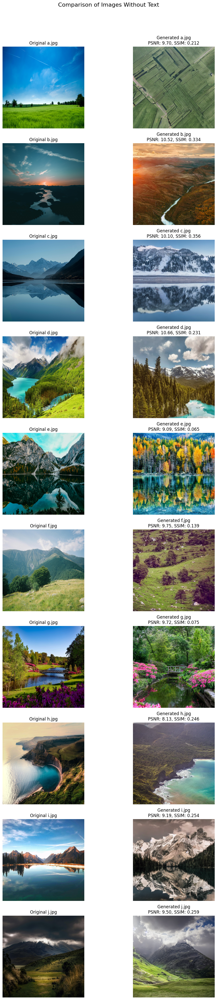

In [ ]:
# Images without text
show_comparison(resized_no_text, sd_no_text, filenames_no_text, num_images=min(10, len(resized_no_text)), title='Comparison of Images Without Text')


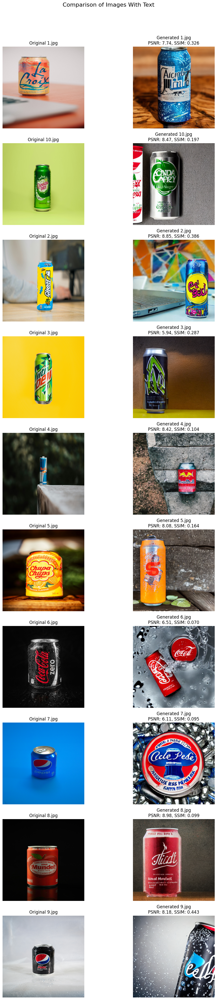

In [ ]:
# Images with text
show_comparison(resized_with_text, sd_with_text, filenames_with_text, num_images=min(10, len(resized_with_text)), title='Comparison of Images With Text')